### Image Processing

#### Image Processing enhances the data analysis and visualization by improving image quality, feature extraction, faciliting classification and providing interactive, multi-dimensional views. Using Image Processing helps stakeholders to discover patterns in data, make data-driven decisions and communicate insights effectively. 

In [21]:
%store -r grayscale_zint_array
%store -r M31_data

grayscale_zint_array

array([[131, 152, 123, ..., 107, 175, 131],
       [140, 146, 113, ..., 120, 107, 126],
       [111, 255, 117, ..., 113, 120, 133],
       ...,
       [166, 152, 153, ..., 143, 230, 146],
       [158, 157, 157, ..., 150, 152, 151],
       [155, 152, 144, ..., 138, 150, 152]], dtype=uint8)

### Removing noise by Guassian Smoothing

#### Guassian Smoothing is also known as Guassian Blur. It is a noise reducation technique used in image processing and data visualization.
#### Guassian Smoothing works by convolving an image or dataset with a Guassian Kernel. A Guassian Kernel is a small matrix representing the Guassian function. For each point in dataset, the surrounding points are multiplied by corresponding values in the Gaussian kernel, and then summed up. This weighted sum replaces the original value, thus creating a smoother output.

#### Padding is used to keep the dimensions of dataset same. For first data point 60, we got resultant value of 114 after convolution. 
#### 0x0 + 0x-1 + 0x0 + 0x-1 + 60x5 + 113x-1 + 0x0 + 73x-1 + 121x0 = 114

**<u>Convolution</u>:-**       
<img src='https://miro.medium.com/max/1400/1*O06nY1U7zoP4vE5AZEnxKA.gif' width=50%>

#### The covolution filter used for Guassian Smoothing can be imported from Scipy library

In [14]:
#Installing Scipy
%pip install Scipy

Note: you may need to restart the kernel to use updated packages.


In [15]:
#Importing convolution filter from Scipy 
from scipy.signal import convolve2d

In [19]:
#Creating a basic filter
kernel = np.ones((3,3))/9
kernel

array([[0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111]])

In [20]:
# Creating a gaussian kernel
gaussian_kernel = np.array([[1/16, 1/8, 1/16],
                            [1/8, 1/4, 1/8],
                            [1/16, 1/8, 1/16]])

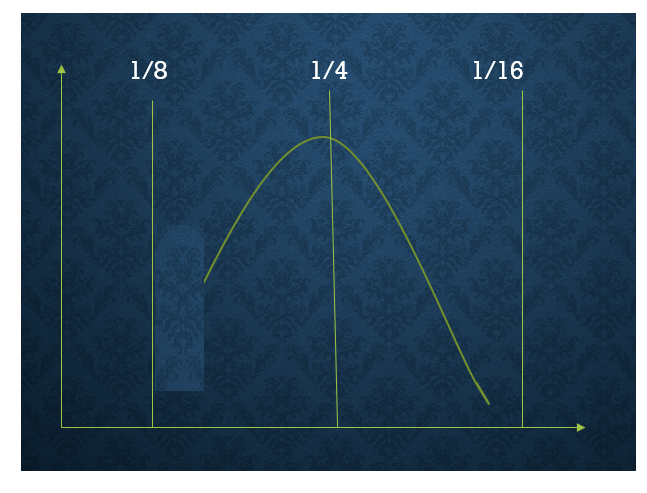

#### First we will apply convolution to the original data array


In [27]:
#Applying convolution with basic filter
og_convolved_array = convolve2d(M31_data, kernel, mode='same')

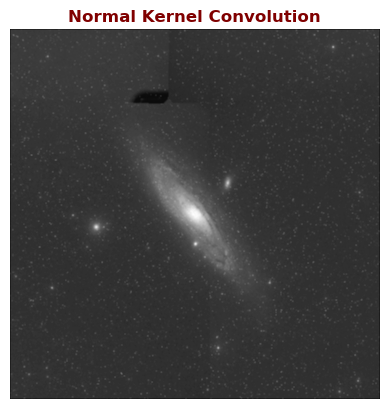

In [28]:
# Plotting the basic kernel convolution
plot_pixels(og_convolved_array, title='Normal Kernel Convolution', color='maroon')

In [29]:
#Applying convolution with Guassian filter
og_gconvolved_array = convolve2d(M31_data, gaussian_kernel, mode='same')

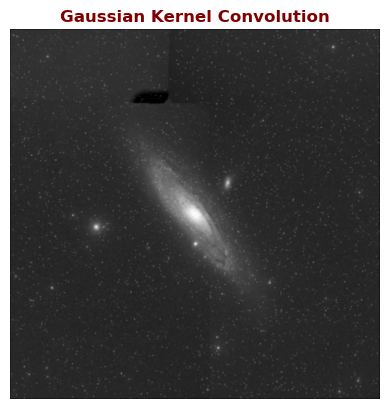

In [30]:
# Visualize the gausian kernel convolved output
plot_pixels(og_gconvolved_array, title='Gaussian Kernel Convolution', color='maroon')

#### Now, we will use Grayscale ZscaleInterval array and apply convolution

In [31]:
#Using grayscalel of M31 data to convolve with gaussian kernel
convolved_grayscale = convolve2d(grayscale_zint_array, gaussian_kernel, mode='same')

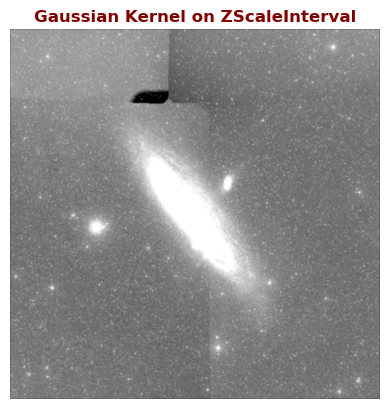

In [32]:
#Visualizing convolved array
plot_pixels(convolved_grayscale, title='Gaussian Kernel on ZScaleInterval', color='maroon')

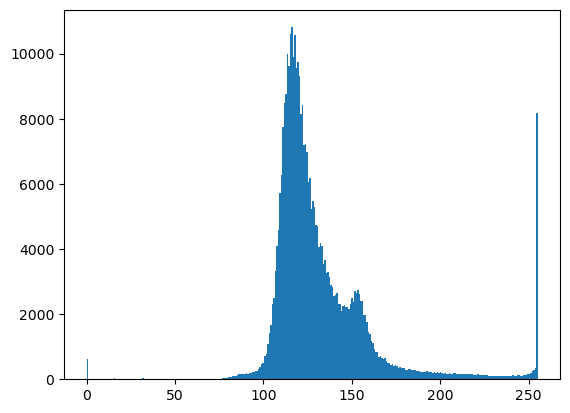

In [33]:
#Preparing a histogram to check the distribution of data points after convolution
plt.hist(convolved_grayscale.flat, bins=300)
plt.show()

### Enhancing the linear features of convolved array

#### For feature enhancing, we will make use of Meijering and Sato filters from skimage library

In [34]:
#Importing meijering and sato filters
from skimage.filters import meijering, sato

In [35]:
#Applying the imported filters on convolved array
meijering_output = meijering(convolved_grayscale)
sato_output = sato(convolved_grayscale)

In [36]:
#We will create a list of different colormaps to visualize the filtered output
SPECTRAL_LIST = ["gray","jet","hot","prism","nipy_spectral"]

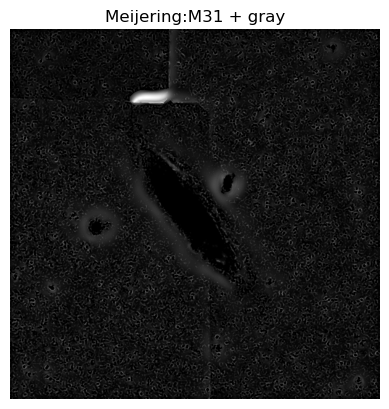

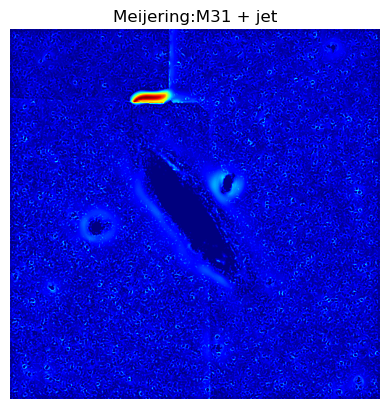

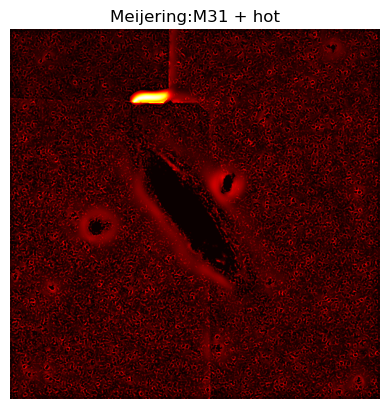

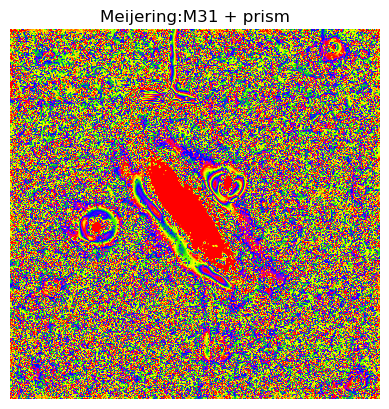

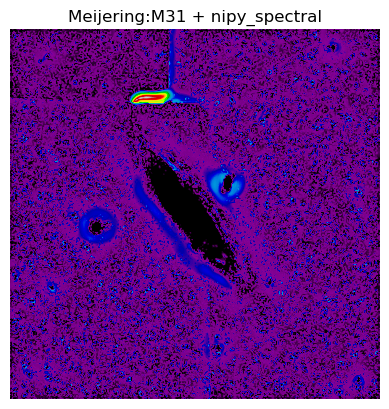

In [38]:
#Creating a for loop to iterate through every colormap present in spectral list and plot an image
for comap in SPECTRAL_LIST:
    plt.imshow(meijering_output, cmap=comap, origin='lower')
    plt.title(f'Meijering:M31 + {comap}')
    plt.axis('off')
    plt.show()

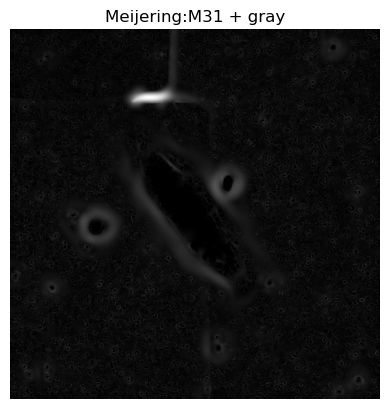

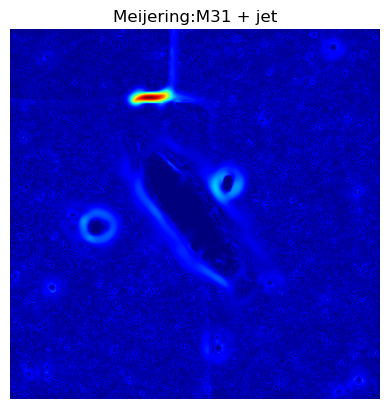

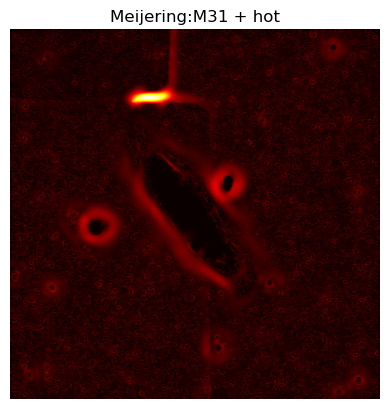

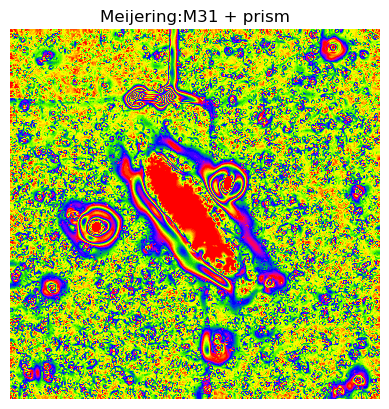

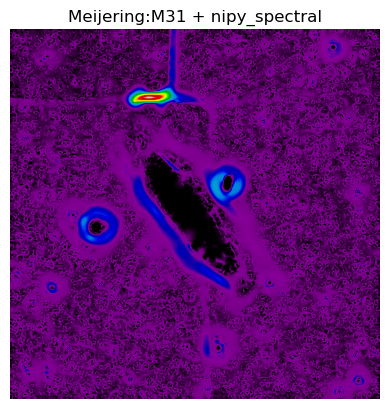

In [39]:
#Creating a for loop to iterate through every colormap present in spectral list and plot an image
for comap in SPECTRAL_LIST:
    plt.imshow(sato_output, cmap=comap, origin='lower')
    plt.title(f'Meijering:M31 + {comap}')
    plt.axis('off')
    plt.show()

### Feature Detection and Extraction

explain feature detection and extraction

#### skiamge different features:- https://scikit-image.org/docs/stable/api/skimage.feature.html

### corner_foerstner

In [40]:
#Importing feature from skimage library
from skimage.feature import corner_foerstner

In [41]:
#Passing convolved_grayscale array through the feature
feature_output = corner_foerstner(convolved_grayscale)

In [42]:
feature_output[1]

array([[0.74885267, 0.73230276, 0.32427489, ..., 0.28846567, 0.74263541,
        0.7866002 ],
       [0.68332179, 0.95045369, 0.66600407, ..., 0.59408299, 0.96956452,
        0.71833841],
       [0.28755653, 0.58869116, 0.98976815, ..., 0.99867534, 0.56137056,
        0.26374898],
       ...,
       [0.24317324, 0.54788046, 0.98422246, ..., 0.99724591, 0.58261504,
        0.27694325],
       [0.65886517, 0.91199293, 0.55070215, ..., 0.58172414, 0.92116044,
        0.66890424],
       [0.72439952, 0.67043553, 0.24842672, ..., 0.26258511, 0.67810826,
        0.72328556]])

In [43]:
type(feature_output)

tuple

In [45]:
len(feature_output)

2

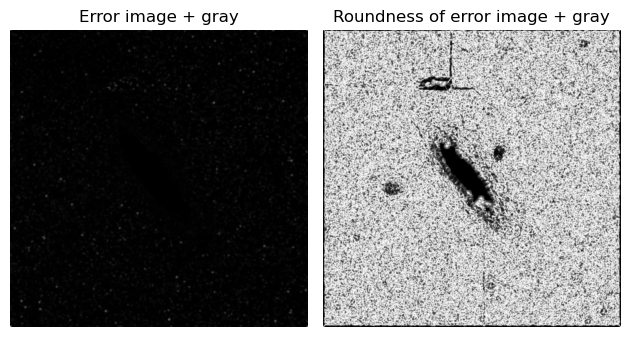

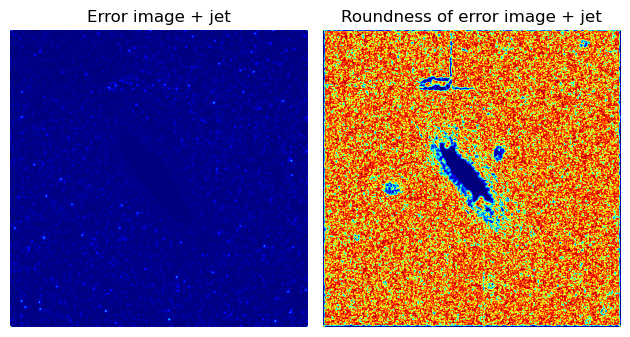

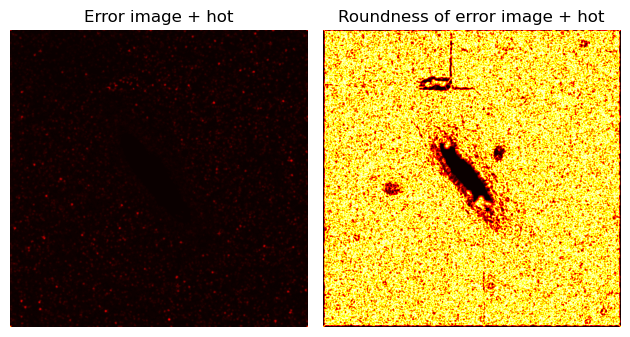

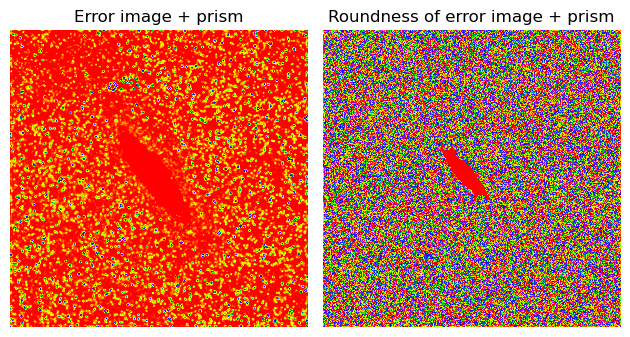

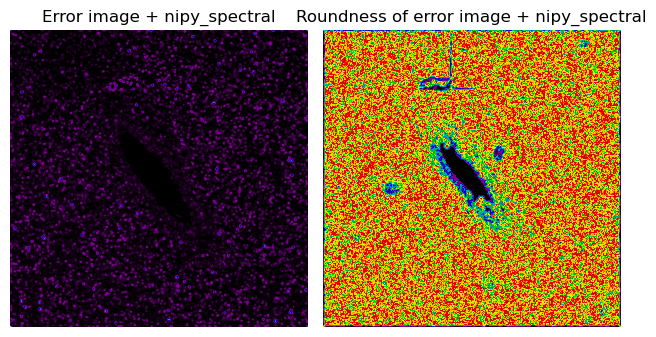

In [51]:
#Visualizing both error and roundness of error with spectral filters
for comap in SPECTRAL_LIST:
    plt.subplot(1,2,1)
    plt.imshow(feature_output[0], cmap=comap, origin='lower')
    plt.title(f'Error image + {comap}')
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.imshow(feature_output[1], cmap=comap, origin='lower')
    plt.title(f'Roundness of error image + {comap}')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

#### Trying another feature - Multiscale Basic Feature

In [53]:
#Importing multiscale basic feature
from skimage.feature import multiscale_basic_features

In [54]:
#Passing convolved grayscale array through the feature
multi_featured_image = multiscale_basic_features(convolved_grayscale)

In [57]:
type(multi_featured_image)

numpy.ndarray

In [58]:
multi_featured_image.shape

(600, 600, 24)

#### Here, we got 24 different channels. We will store and visualize each and every channel with the help of different filter

In [61]:
#Storing all 24 channels in user defined variables
P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,P15,P16,P17,P18,P19,P20,P21,P22,P23,P24 = cv2.split(multi_featured_image)

In [62]:
Pixels = [P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,P15,P16,P17,P18,P19,P20,P21,P22,P23,P24]

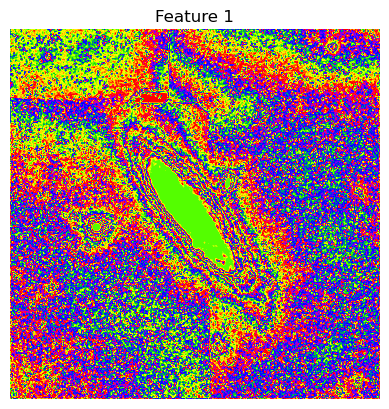

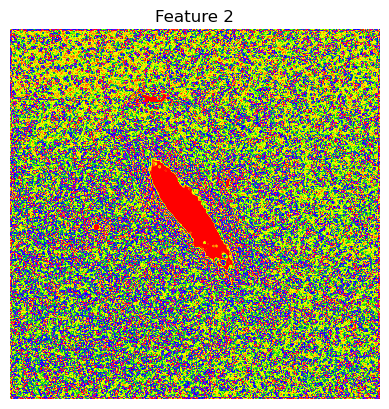

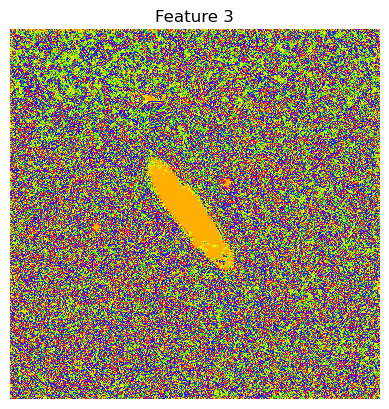

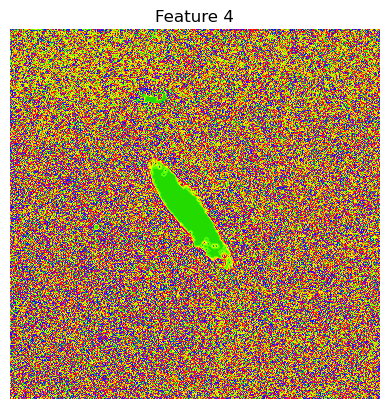

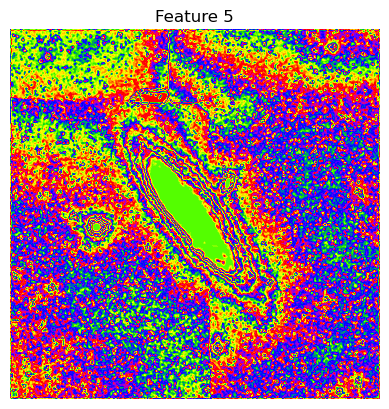

...

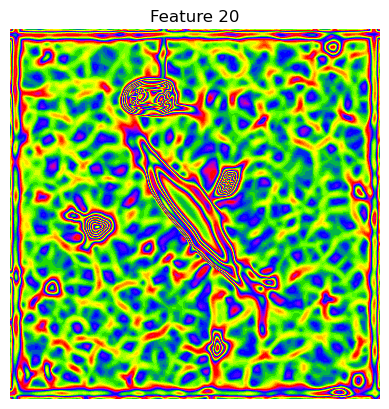

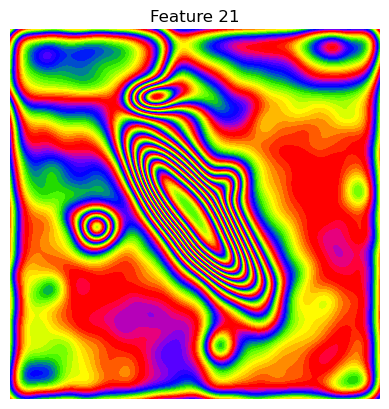

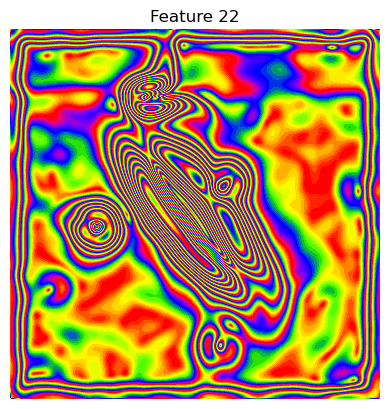

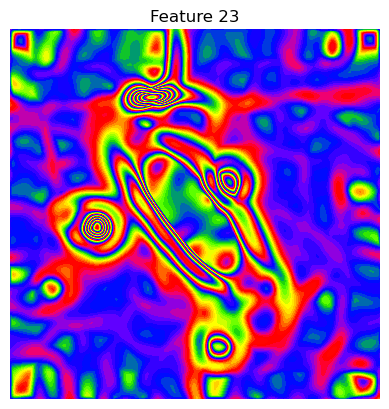

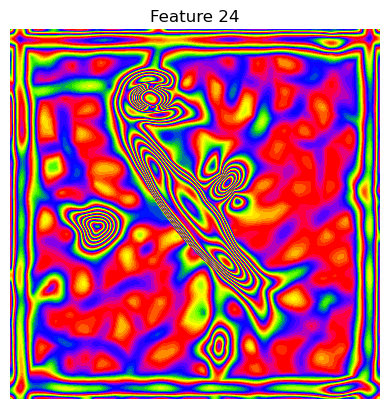

In [63]:
# Visualize each channel using prism spectral
for i, feature in enumerate(Pixels):
  plt.imshow(feature, cmap='prism', origin='lower')
  plt.title(f'Feature {i+1}')
  plt.axis('off')
  plt.show()

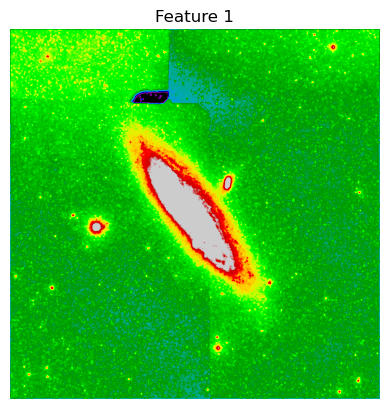

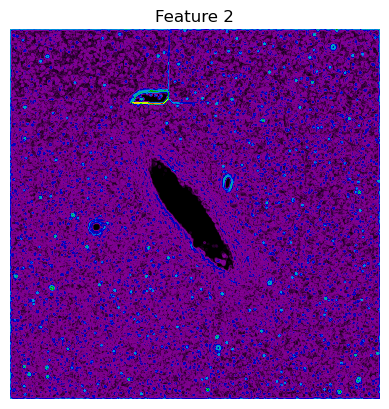

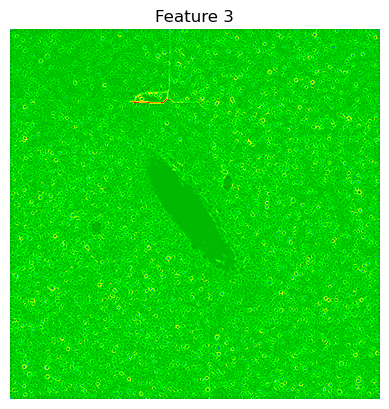

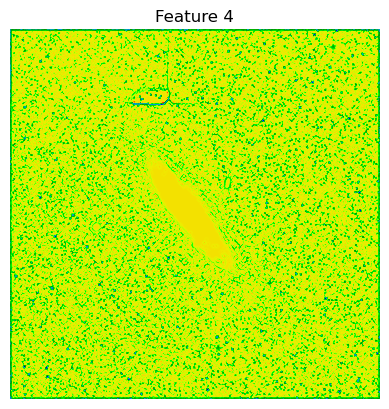

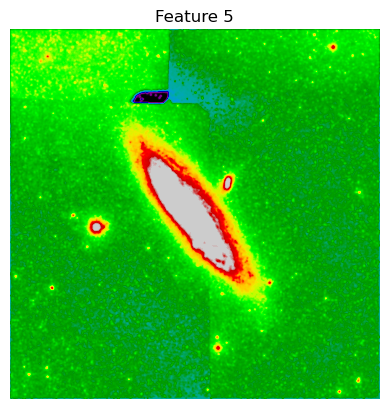

...

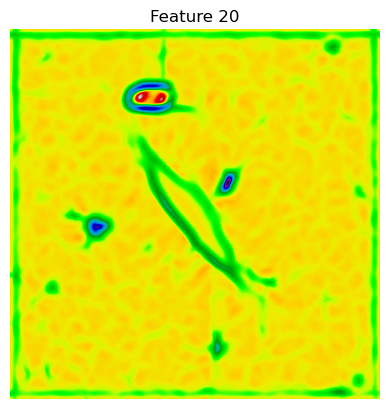

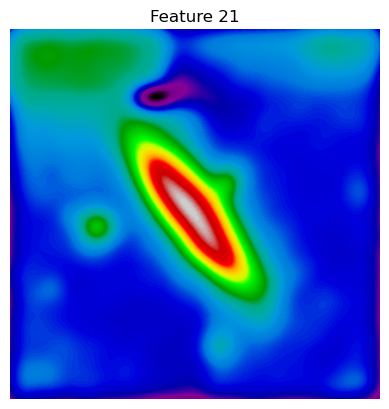

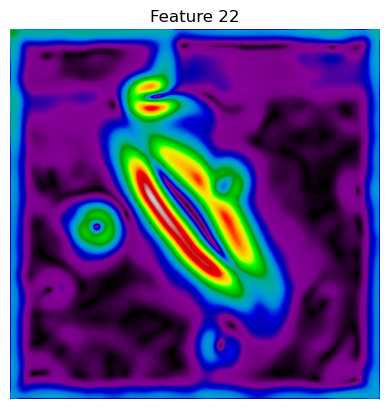

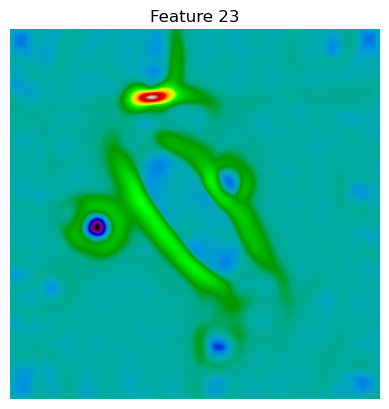

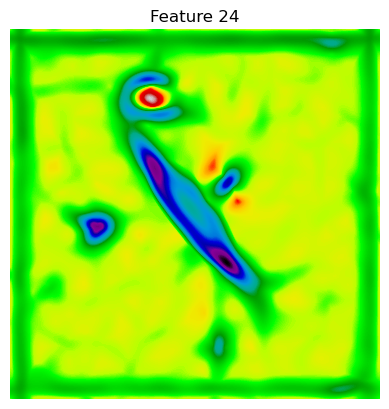

In [64]:
# Visualize each channel using nipy spectral
for i, feature in enumerate(Pixels):
  plt.imshow(feature, cmap='nipy_spectral', origin='lower')
  plt.title(f'Feature {i+1}')
  plt.axis('off')
  plt.show()